In [ ]:
import pandas as pd
import numpy as np
df = pd.read_csv('/content/mightymerge.io__4oqx5yci.csv', index_col=0)

In [ ]:
df = df.copy()  # fixes the root cause


In [ ]:
import pandas as pd

# Assuming the date is in the index already
df.index = pd.to_datetime(df.index)

# Extracting as numerical columns
df['hour'] = df.index.hour        # e.g., 5, 6, 7...
df['day'] = df.index.day          # e.g., 1, 2, 3...
df['month'] = df.index.month      # e.g., 1=January, 2=Feb...

# Optional: Move to front
df = df[['hour', 'day', 'month'] + [col for col in df.columns if col not in ['hour', 'day', 'month']]]

# Show result
print(df.head())

                     hour  day  month  temperature_2m (°C)  \
time                                                         
2023-01-01 00:00:00     0    1      1                  4.8   
2023-01-01 01:00:00     1    1      1                  4.1   
2023-01-01 02:00:00     2    1      1                  4.2   
2023-01-01 03:00:00     3    1      1                  3.8   
2023-01-01 04:00:00     4    1      1                  4.4   

                     relative_humidity_2m (%)  rain (mm)  \
time                                                       
2023-01-01 00:00:00                        85        0.0   
2023-01-01 01:00:00                        87        0.0   
2023-01-01 02:00:00                        84        0.0   
2023-01-01 03:00:00                        85        0.0   
2023-01-01 04:00:00                        81        0.0   

                     wind_speed_10m (km/h)  wind_direction_10m (°)  \
time                                                                 
2023

In [ ]:
df['hour_sin'] = np.sin(2 * np.pi * df['hour'] / 24)
df['hour_cos'] = np.cos(2 * np.pi * df['hour'] / 24)

In [ ]:
df

,hour,day,month,temperature_2m (°C),relative_humidity_2m (%),rain (mm),wind_speed_10m (km/h),wind_direction_10m (°),pm10 (μg/m³),pm2_5 (μg/m³),carbon_monoxide (μg/m³),carbon_dioxide (ppm),nitrogen_dioxide (μg/m³),sulphur_dioxide (μg/m³),ozone (μg/m³),us_aqi (USAQI),hour_sin,hour_cos
time,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00,0,1,1,4.8,85,0.0,7.6,315,73.1,49.7,1775,NaN,74.4,6.9,26,132,0.000000,1.000000
2023-01-01 01:00:00,1,1,1,4.1,87,0.0,7.9,309,66.1,44.4,1495,NaN,59.7,6.3,37,131,0.258819,0.965926
2023-01-01 02:00:00,2,1,1,4.2,84,0.0,5.4,290,60.8,40.4,1186,NaN,41.8,5.9,49,130,0.500000,0.866025
2023-01-01 03:00:00,3,1,1,3.8,85,0.0,5.3,298,56.6,37.4,1001,NaN,31.0,5.6,56,129,0.707107,0.707107
2023-01-01 04:00:00,4,1,1,4.4,81,0.0,4.4,305,53.6,35.4,856,NaN,21.3,5.4,61,128,0.866025,0.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-17 01:00:00,1,17,7,23.3,90,0.8,11.0,49,8.8,8.6,417,460.0,22.6,1.9,44,61,0.258819,0.965926
2025-07-17 02:00:00,2,17,7,23.4,91,1.5,6.6,99,8.4,8.1,316,459.0,20.0,1.8,45,58,0.500000,0.866025
2025-07-17 03:00:00,3,17,7,23.2,92,6.0,9.7,50,10.0,9.1,265,459.0,17.1,1.9,48,56,0.707107,0.707107


In [ ]:
df['is_rain'] = np.where(df['rain (mm)'] > 0, 1, 0)


In [ ]:
df.columns

Index(['hour', 'day', 'month', 'temperature_2m (°C)',
       'relative_humidity_2m (%)', 'rain (mm)', 'wind_speed_10m (km/h)',
       'wind_direction_10m (°)', 'pm10 (μg/m³)', 'pm2_5 (μg/m³)',
       'carbon_monoxide (μg/m³)', 'carbon_dioxide (ppm)',
       'nitrogen_dioxide (μg/m³)', 'sulphur_dioxide (μg/m³)', 'ozone (μg/m³)',
       'us_aqi (USAQI)', 'hour_sin', 'hour_cos', 'is_rain'],
      dtype='object')

In [ ]:
df.columns = df.columns.str.replace(r'[^A-Za-z0-9]', '', regex=True).str.lower()


# Remove rows with the empty columns


In [ ]:
df.isnull().sum()

,0
hour,0
day,0
month,0
temperature2mc,0
relativehumidity2m,0
rainmm,0
windspeed10mkmh,0
winddirection10m,0
pm10gm,0
pm25gm,0


In [ ]:
df.dtypes

,0
hour,int32
day,int32
month,int32
temperature2mc,float64
relativehumidity2m,int64
rainmm,float64
windspeed10mkmh,float64
winddirection10m,int64
pm10gm,float64
pm25gm,float64


In [ ]:
features = [
    'hour',
    'day',
    'month',
    'temperature2mc',
    'relativehumidity2m',
    'rainmm',
    'windspeed10mkmh',
    'winddirection10m',
    'pm10gm',
    'pm25gm',
    'carbonmonoxidegm',
    'carbondioxideppm',
    'nitrogendioxidegm',
    'sulphurdioxidegm',
    'ozonegm',
    'hoursin',
    'hourcos',
    'israin'
]


# Calculate skewness for each
skew_values = df[features].skew()

# Display as a nice DataFrame
skew_df = pd.DataFrame(skew_values, columns=['Skewness'])
print(skew_df.sort_values(by='Skewness', ascending=False))

                     Skewness
rainmm              10.227251
sulphurdioxidegm     3.190880
israin               2.775554
pm10gm               2.042509
carbonmonoxidegm     1.620115
pm25gm               1.476737
windspeed10mkmh      1.176434
nitrogendioxidegm    0.972093
carbondioxideppm     0.956105
ozonegm              0.526027
month                0.239558
day                  0.028246
hour                 0.000395
hoursin             -0.000368
hourcos             -0.000432
temperature2mc      -0.025298
winddirection10m    -0.201715
relativehumidity2m  -0.267638


In [ ]:
zero_ratio = (df['rainmm'] == 0).mean()
print(f"Zeros in rainmm: {zero_ratio:.2%}")


Zeros in rainmm: 90.56%


In [ ]:
skewed_cols = [
    'sulphurdioxidegm',
    'pm10gm',
    'carbonmonoxidegm',
    'pm25gm',
    'windspeed10mkmh'
]
import numpy as np

for col in skewed_cols:
    df[col + '_log'] = np.log1p(df[col])  # log1p(x) = log(1 + x), handles 0s safely


In [ ]:
df

,hour,day,month,temperature2mc,relativehumidity2m,rainmm,windspeed10mkmh,winddirection10m,pm10gm,pm25gm,...,ozonegm,usaqiusaqi,hoursin,hourcos,israin,sulphurdioxidegm_log,pm10gm_log,carbonmonoxidegm_log,pm25gm_log,windspeed10mkmh_log
time,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00,0,1,1,4.8,85,0.0,7.6,315,73.1,49.7,...,26,132,0.000000,1.000000,0,2.066863,4.305416,7.482119,3.925926,2.151762
2023-01-01 01:00:00,1,1,1,4.1,87,0.0,7.9,309,66.1,44.4,...,37,131,0.258819,0.965926,0,1.987874,4.206184,7.310550,3.815512,2.186051
2023-01-01 02:00:00,2,1,1,4.2,84,0.0,5.4,290,60.8,40.4,...,49,130,0.500000,0.866025,0,1.931521,4.123903,7.079184,3.723281,1.856298
2023-01-01 03:00:00,3,1,1,3.8,85,0.0,5.3,298,56.6,37.4,...,56,129,0.707107,0.707107,0,1.887070,4.053523,6.909753,3.648057,1.840550
2023-01-01 04:00:00,4,1,1,4.4,81,0.0,4.4,305,53.6,35.4,...,61,128,0.866025,0.500000,0,1.856298,4.000034,6.753438,3.594569,1.686399
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-17 01:00:00,1,17,7,23.3,90,0.8,11.0,49,8.8,8.6,...,44,61,0.258819,0.965926,1,1.064711,2.282382,6.035481,2.261763,2.484907
2025-07-17 02:00:00,2,17,7,23.4,91,1.5,6.6,99,8.4,8.1,...,45,58,0.500000,0.866025,1,1.029619,2.240710,5.758902,2.208274,2.028148
2025-07-17 03:00:00,3,17,7,23.2,92,6.0,9.7,50,10.0,9.1,...,48,56,0.707107,0.707107,1,1.064711,2.397895,5.583496,2.312535,2.370244


In [ ]:
features = [
    'sulphurdioxidegm_log',
    'pm10gm_log',
    'carbonmonoxidegm_log',
    'pm25gm_log',
    'windspeed10mkmh_log'
]


# Calculate skewness for each
skew_values = df[features].skew()

# Display as a nice DataFrame
skew_df = pd.DataFrame(skew_values, columns=['Skewness'])
print(skew_df.sort_values(by='Skewness', ascending=False))

                      Skewness
carbonmonoxidegm_log  0.195612
sulphurdioxidegm_log  0.073328
pm25gm_log           -0.061402
pm10gm_log           -0.121897
windspeed10mkmh_log  -0.499603


In [ ]:

from scipy.stats import skew, kurtosis
import pandas as pd

# List of columns you want to analyze
features = [
     'sulphurdioxidegm_log',
    'pm10gm_log',
    'carbonmonoxidegm_log',
    'pm25gm_log',
    'windspeed10mkmh_log',    'hour',
    'day',
    'month',
    'temperature2mc',
    'relativehumidity2m',
    'rainmm',
    'winddirection10m',
    'carbondioxideppm',
    'nitrogendioxidegm',
    'ozonegm',
    'hoursin',
    'hourcos',
    'israin'
]


# Calculate skewness and kurtosis
skew_kurt = {
    'Skewness': [skew(df[col]) for col in features],
    'Kurtosis': [kurtosis(df[col]) for col in features]
}

# Create DataFrame for results
skew_kurt_df = pd.DataFrame(skew_kurt, index=features)
print(skew_kurt_df.sort_values(by='Skewness', ascending=False))

                       Skewness    Kurtosis
rainmm                10.226562  139.076273
israin                 2.775367    5.702661
nitrogendioxidegm      0.972028    0.182495
ozonegm                0.525991   -0.819929
month                  0.239542   -1.082876
carbonmonoxidegm_log   0.195599   -0.766384
sulphurdioxidegm_log   0.073324   -0.021458
day                    0.028244   -1.190422
hour                   0.000395   -1.204446
hoursin               -0.000368   -1.499955
hourcos               -0.000432   -1.500045
temperature2mc        -0.025297   -0.792958
pm25gm_log            -0.061398   -0.011547
pm10gm_log            -0.121888    0.163444
winddirection10m      -0.201702   -1.578380
relativehumidity2m    -0.267620   -0.797316
windspeed10mkmh_log   -0.499569    0.423924
carbondioxideppm            NaN         NaN


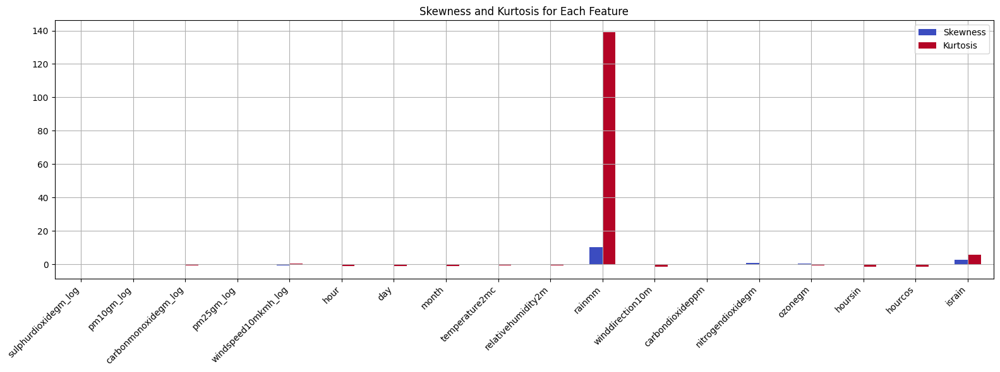

In [ ]:
from scipy.stats import skew, kurtosis
import matplotlib.pyplot as plt
import pandas as pd

features = [
    'sulphurdioxidegm_log',
    'pm10gm_log',
    'carbonmonoxidegm_log',
    'pm25gm_log',
    'windspeed10mkmh_log',    'hour',
    'day',
    'month',
    'temperature2mc',
    'relativehumidity2m',
    'rainmm',
    'winddirection10m',
    'carbondioxideppm',
    'nitrogendioxidegm',
    'ozonegm',
    'hoursin',
    'hourcos',
    'israin'
]

# Compute skewness and kurtosis
skew_vals = [skew(df[col]) for col in features]
kurt_vals = [kurtosis(df[col]) for col in features]

sk_kurt_df = pd.DataFrame({'Skewness': skew_vals, 'Kurtosis': kurt_vals}, index=features)

# Plot
sk_kurt_df.plot(kind='bar', figsize=(16, 6), colormap='coolwarm')
plt.title("Skewness and Kurtosis for Each Feature")
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.tight_layout()
plt.show()


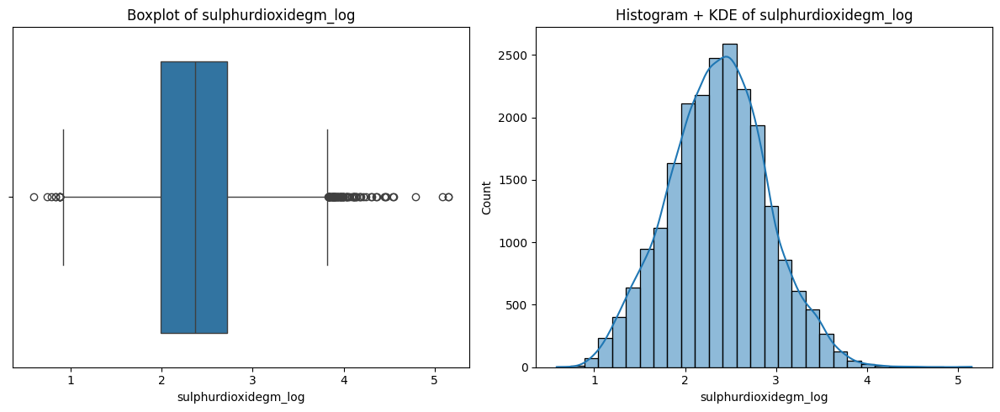

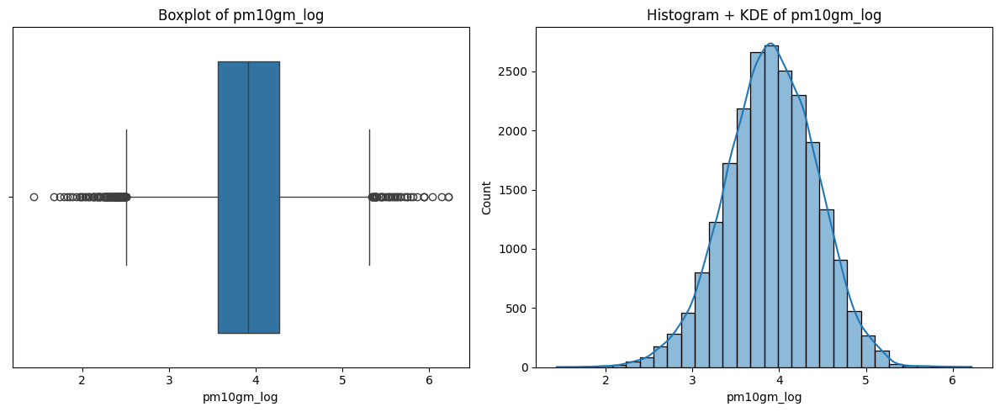

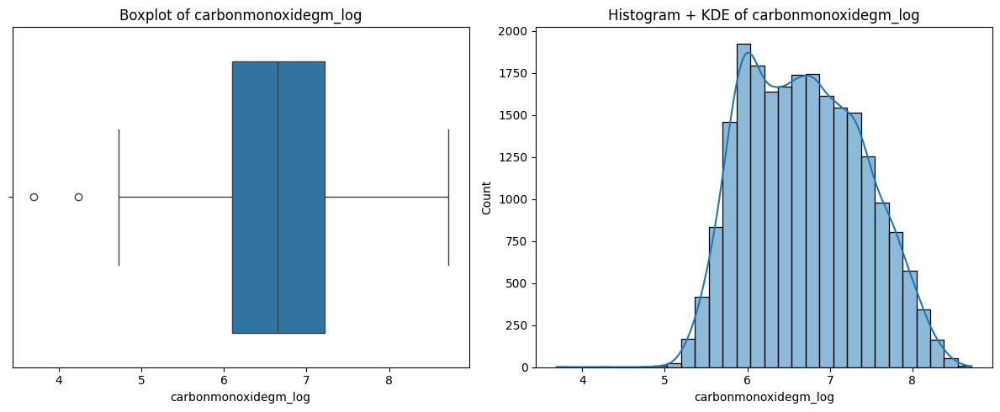

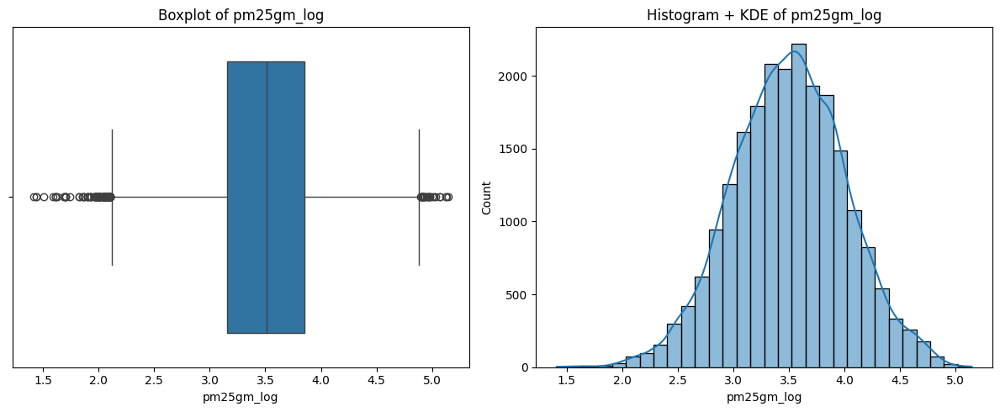

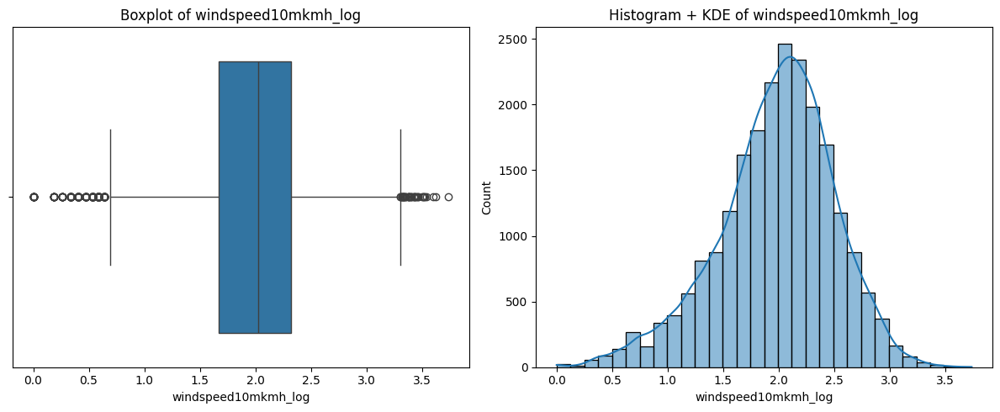

...

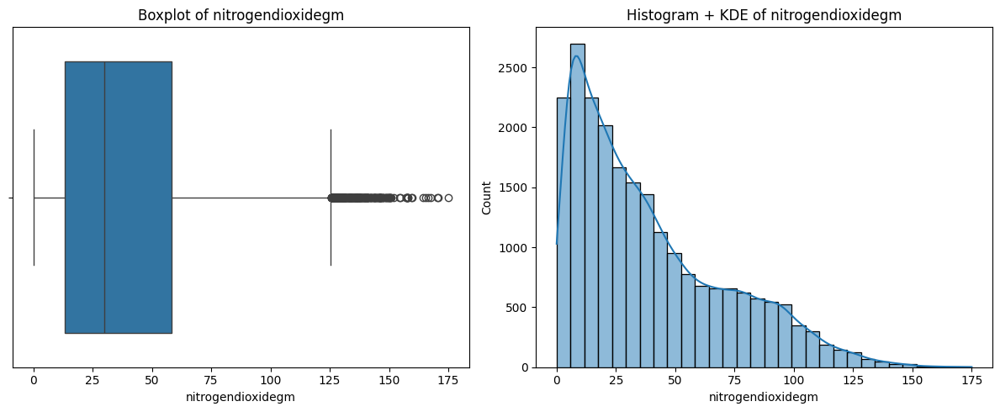

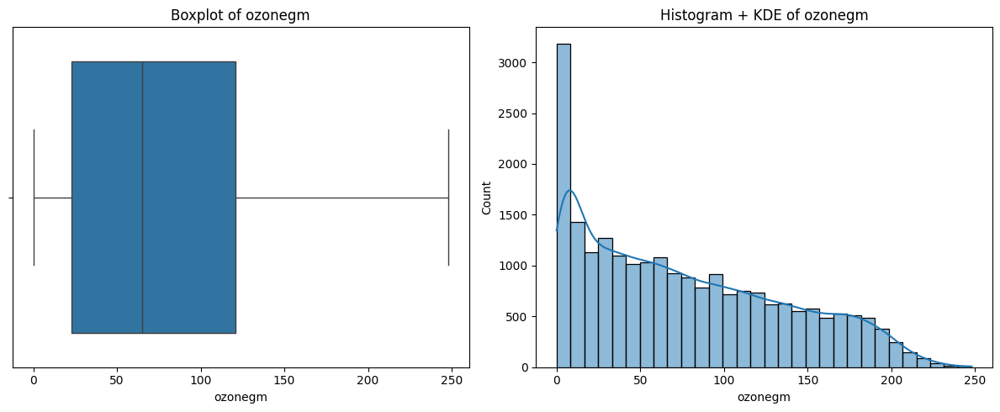

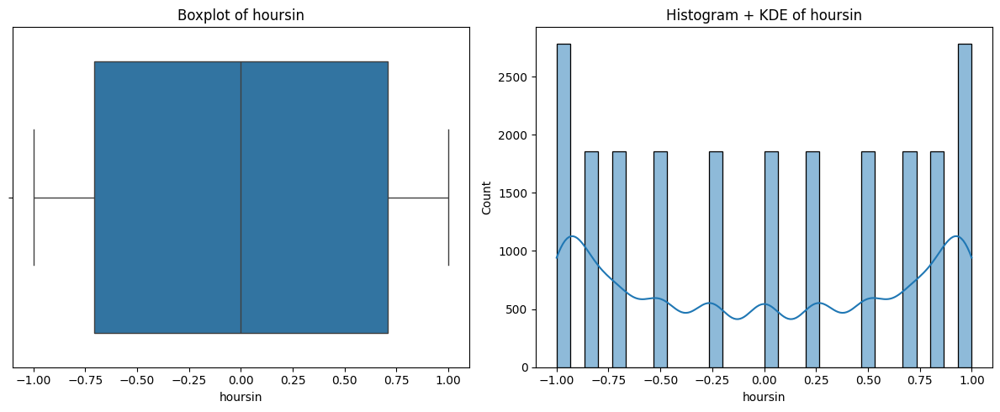

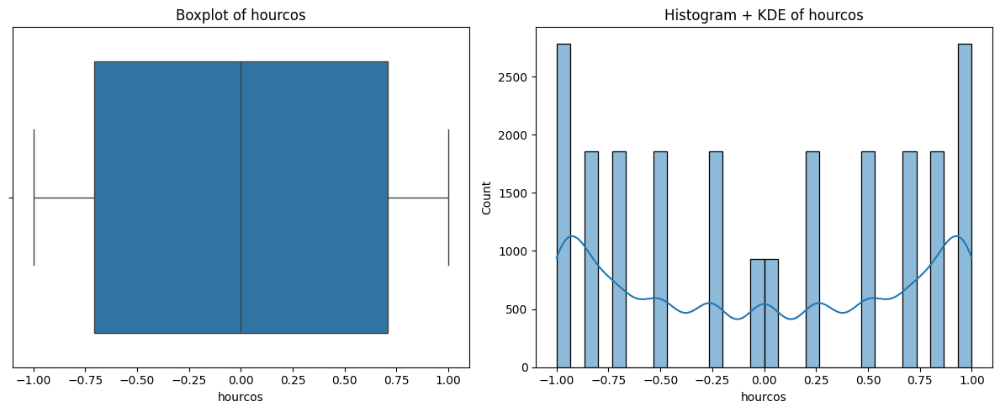

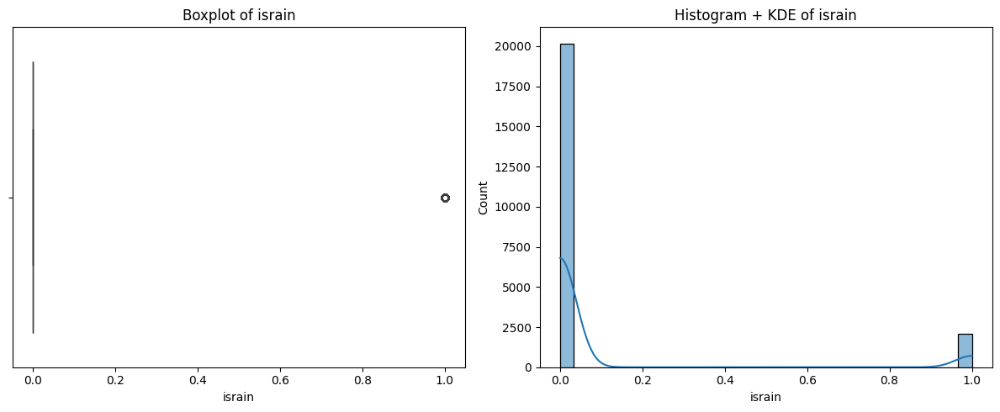

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of numerical columns
columns_to_check = [ 'sulphurdioxidegm_log',
    'pm10gm_log',
    'carbonmonoxidegm_log',
    'pm25gm_log',
    'windspeed10mkmh_log',    'hour',
    'day',
    'month',
    'temperature2mc',
    'relativehumidity2m',
    'rainmm',
    'winddirection10m',
    'nitrogendioxidegm',
    'ozonegm',
    'hoursin',
    'hourcos',
    'israin']

for col in columns_to_check:
    plt.figure(figsize=(12, 5))

    # Boxplot
    plt.subplot(1, 2, 1)
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')

    # Histogram + KDE
    plt.subplot(1, 2, 2)
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f'Histogram + KDE of {col}')

    plt.tight_layout()
    plt.show()

In [ ]:
df.drop(['carbondioxideppm'], axis=1, inplace=True)

In [ ]:
from scipy.stats import zscore

z_scores = np.abs(zscore(df[[
  'sulphurdioxidegm_log',
    'pm10gm_log',
    'carbonmonoxidegm_log',
    'pm25gm_log',
    'windspeed10mkmh_log',    'hour',
    'day',
    'month',
    'temperature2mc',
    'relativehumidity2m',
    'rainmm',
    'winddirection10m',
    'nitrogendioxidegm',
    'ozonegm',
    'hoursin',
    'hourcos',
    'israin'
]]))
df_clean = df[(z_scores < 3).all(axis=1)]

In [ ]:
print(df_clean)

                     hour  day  month  temperature2mc  relativehumidity2m  \
time                                                                        
2023-01-01 00:00:00     0    1      1             4.8                  85   
2023-01-01 01:00:00     1    1      1             4.1                  87   
2023-01-01 02:00:00     2    1      1             4.2                  84   
2023-01-01 03:00:00     3    1      1             3.8                  85   
2023-01-01 04:00:00     4    1      1             4.4                  81   
...                   ...  ...    ...             ...                 ...   
2025-07-16 02:00:00     2   16      7            25.3                  81   
2025-07-16 03:00:00     3   16      7            25.2                  82   
2025-07-16 04:00:00     4   16      7            25.3                  80   
2025-07-16 17:00:00    17   16      7            26.1                  79   
2025-07-16 18:00:00    18   16      7            26.8                  78   

In [ ]:
columns = [
    'sulphurdioxidegm_log',
    'pm10gm_log',
    'carbonmonoxidegm_log',
    'pm25gm_log',
    'windspeed10mkmh_log',    'hour',
    'day',
    'month',
    'temperature2mc',
    'relativehumidity2m',
    'rainmm',
    'winddirection10m',
    'nitrogendioxidegm',
    'ozonegm',
    'hoursin',
    'hourcos',
    'israin'
]

for i, col in enumerate(columns):
    outliers = df[np.abs(z_scores[:, i]) > 3]
    print(f"Outliers in {col}:")
    print(outliers[[col]])
    print("------")

Outliers in sulphurdioxidegm_log:
                     sulphurdioxidegm_log
time                                     
2023-01-15 17:00:00              4.130355
2023-01-15 18:00:00              4.039536
2023-01-16 16:00:00              4.130355
2023-01-16 17:00:00              4.112512
2023-01-17 16:00:00              4.105944
2023-01-17 17:00:00              4.301359
2023-01-17 18:00:00              4.185099
2023-01-18 15:00:00              4.215086
2023-01-18 16:00:00              4.452019
2023-01-18 17:00:00              4.541165
2023-01-18 18:00:00              4.453184
2023-01-18 19:00:00              4.313480
2023-01-18 20:00:00              4.091006
2023-01-19 16:00:00              4.139955
2023-01-19 17:00:00              4.119037
2023-01-19 18:00:00              4.114147
2023-01-19 19:00:00              4.107590
2023-01-19 20:00:00              4.032469
2023-01-26 17:00:00              4.034241
2023-01-27 16:00:00              4.180522
2023-01-27 17:00:00              4.166665


In [ ]:
df

,hour,day,month,temperature2mc,relativehumidity2m,rainmm,windspeed10mkmh,winddirection10m,pm10gm,pm25gm,...,ozonegm,usaqiusaqi,hoursin,hourcos,israin,sulphurdioxidegm_log,pm10gm_log,carbonmonoxidegm_log,pm25gm_log,windspeed10mkmh_log
time,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00,0,1,1,4.8,85,0.0,7.6,315,73.1,49.7,...,26,132,0.000000,1.000000,0,2.066863,4.305416,7.482119,3.925926,2.151762
2023-01-01 01:00:00,1,1,1,4.1,87,0.0,7.9,309,66.1,44.4,...,37,131,0.258819,0.965926,0,1.987874,4.206184,7.310550,3.815512,2.186051
2023-01-01 02:00:00,2,1,1,4.2,84,0.0,5.4,290,60.8,40.4,...,49,130,0.500000,0.866025,0,1.931521,4.123903,7.079184,3.723281,1.856298
2023-01-01 03:00:00,3,1,1,3.8,85,0.0,5.3,298,56.6,37.4,...,56,129,0.707107,0.707107,0,1.887070,4.053523,6.909753,3.648057,1.840550
2023-01-01 04:00:00,4,1,1,4.4,81,0.0,4.4,305,53.6,35.4,...,61,128,0.866025,0.500000,0,1.856298,4.000034,6.753438,3.594569,1.686399
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-07-17 01:00:00,1,17,7,23.3,90,0.8,11.0,49,8.8,8.6,...,44,61,0.258819,0.965926,1,1.064711,2.282382,6.035481,2.261763,2.484907
2025-07-17 02:00:00,2,17,7,23.4,91,1.5,6.6,99,8.4,8.1,...,45,58,0.500000,0.866025,1,1.029619,2.240710,5.758902,2.208274,2.028148
2025-07-17 03:00:00,3,17,7,23.2,92,6.0,9.7,50,10.0,9.1,...,48,56,0.707107,0.707107,1,1.064711,2.397895,5.583496,2.312535,2.370244


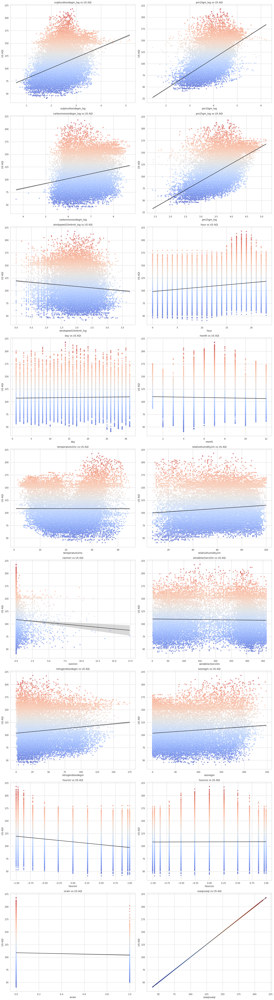

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# List of columns to compare with 'european_aqi'
features = [
        'sulphurdioxidegm_log',
    'pm10gm_log',
    'carbonmonoxidegm_log',
    'pm25gm_log',
    'windspeed10mkmh_log',    'hour',
    'day',
    'month',
    'temperature2mc',
    'relativehumidity2m',
    'rainmm',
    'winddirection10m',
    'nitrogendioxidegm',
    'ozonegm',
    'hoursin',
    'hourcos',
    'israin',
    'usaqiusaqi'
]

# Set the plot style
sns.set(style="whitegrid")

# Plot all scatter plots
plt.figure(figsize=(20, 80))

for i, col in enumerate(features):
    plt.subplot(len(features) // 2 + 1, 2, i + 1)

    # Scatterplot with color hue for AQI
    scatter = sns.scatterplot(
        data=df,
        x=col,
        y='usaqiusaqi',
        hue='usaqiusaqi',
        palette='coolwarm',
        alpha=0.6,
        legend=False
    )

    # Overlay regression line
    sns.regplot(
        data=df,
        x=col,
        y='usaqiusaqi',
        scatter=False,
        color='black',
        line_kws={"linewidth": 1.5}
    )

    plt.title(f'{col} vs US AQI')
    plt.xlabel(col)
    plt.ylabel('US AQI')

plt.tight_layout()
plt.show()

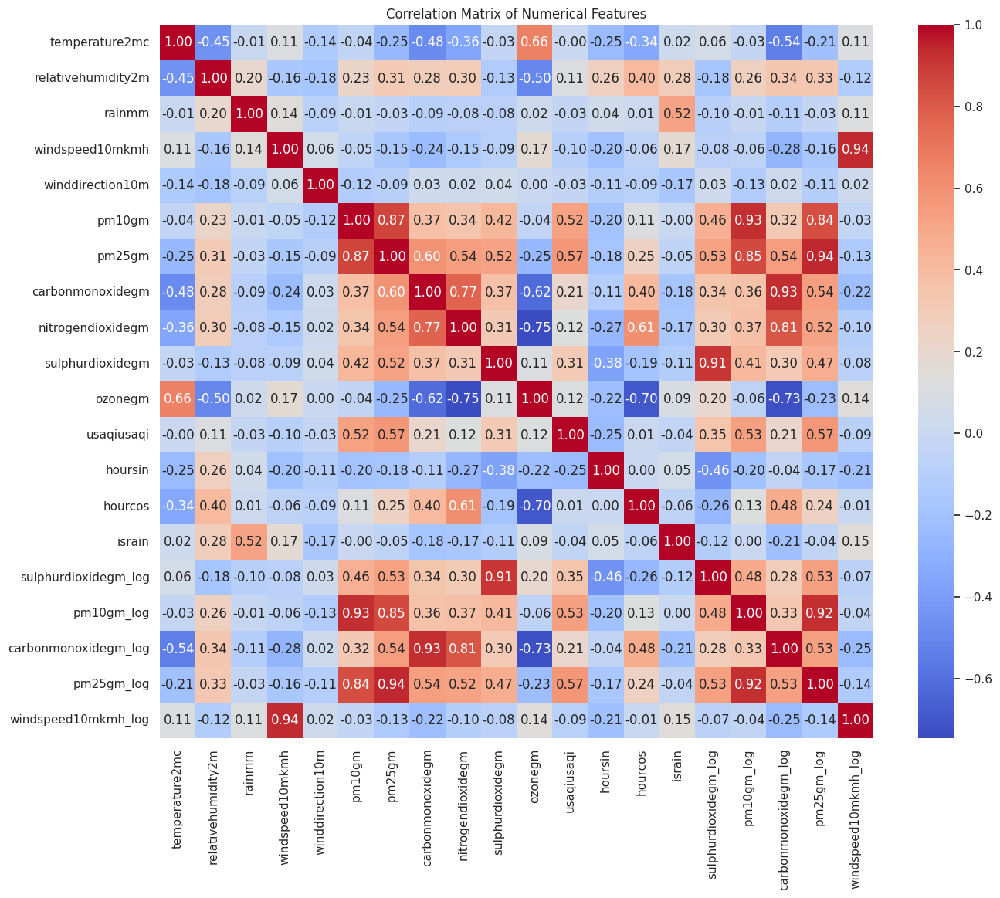

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Select only numerical columns (you already mentioned all are numerical)
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Compute correlation matrix
correlation_matrix = df[numerical_cols].corr()

# Plot the heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation Matrix of Numerical Features")
plt.show()


In [ ]:
import pandas as pd

# Example: if your DataFrame is called df and it has a column 'european_aqi'
features = [
        'sulphurdioxidegm_log',
    'pm10gm_log',
    'carbonmonoxidegm_log',
    'pm25gm_log',
    'windspeed10mkmh_log',    'hour',
    'day',
    'month',
    'temperature2mc',
    'relativehumidity2m',
    'rainmm',
    'winddirection10m',
    'nitrogendioxidegm',
    'ozonegm',
    'hoursin',
    'hourcos',
    'israin',
    'usaqiusaqi'
]

correlations = {}

for feature in features:
    correlations[feature] = df[feature].corr(df['usaqiusaqi'])

# Convert to DataFrame for easier viewing
correlation_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Correlation with AQI'])

# Optional: sort by absolute strength
correlation_df['abs_corr'] = correlation_df['Correlation with AQI'].abs()
correlation_df = correlation_df.sort_values(by='abs_corr', ascending=False).drop(columns='abs_corr')

print(correlation_df)

                      Correlation with AQI
usaqiusaqi                        1.000000
pm25gm_log                        0.572549
pm10gm_log                        0.534208
sulphurdioxidegm_log              0.350469
hoursin                          -0.246429
carbonmonoxidegm_log              0.209405
hour                              0.189645
nitrogendioxidegm                 0.122366
ozonegm                           0.117518
relativehumidity2m                0.107387
windspeed10mkmh_log              -0.090584
israin                           -0.042240
month                            -0.036257
winddirection10m                 -0.026877
rainmm                           -0.025112
day                               0.023023
hourcos                           0.006195
temperature2mc                   -0.001510


In [ ]:
aqi_features = [
    'pm25gm_log',
    'pm10gm_log',
    'sulphurdioxidegm_log',
    'carbonmonoxidegm_log',
    'hoursin',
    'windspeed10mkmh_log'
]


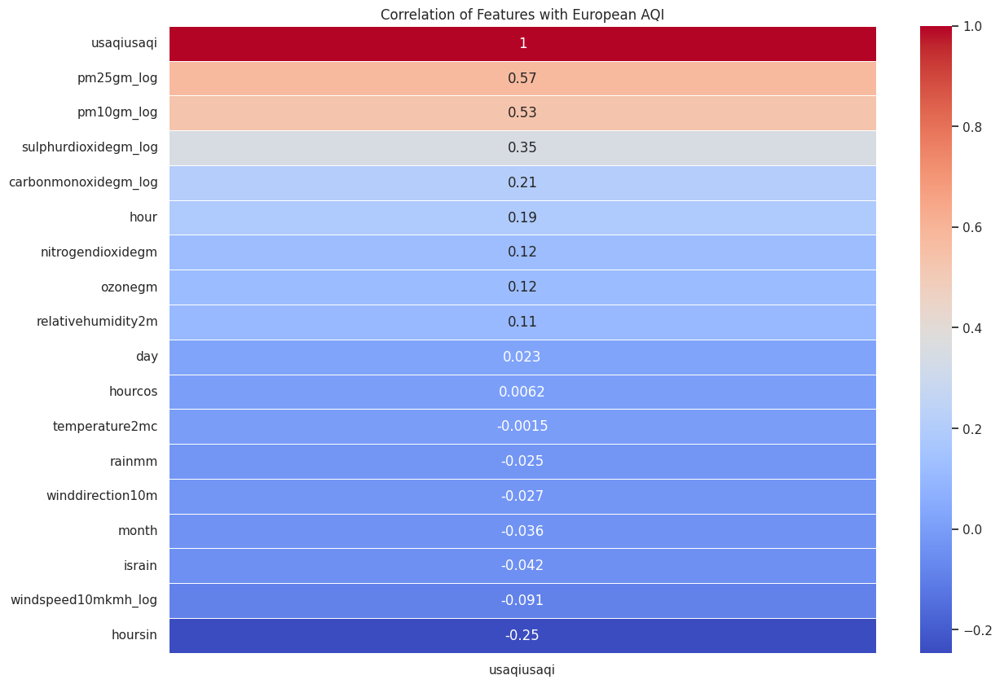

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Select the relevant columns (including AQI)
features = [
   'sulphurdioxidegm_log',
    'pm10gm_log',
    'carbonmonoxidegm_log',
    'pm25gm_log',
    'windspeed10mkmh_log',    'hour',
    'day',
    'month',
    'temperature2mc',
    'relativehumidity2m',
    'rainmm',
    'winddirection10m',
    'nitrogendioxidegm',
    'ozonegm',
    'hoursin',
    'hourcos',
    'israin',
    'usaqiusaqi'
]

# Compute correlation matrix
corr_matrix = df[features].corr()

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(
    corr_matrix[['usaqiusaqi']].sort_values(by='usaqiusaqi', ascending=False),
    annot=True, cmap='coolwarm', linewidths=0.5
)
plt.title('Correlation of Features with European AQI')
plt.show()

In [ ]:
df['AQI_t+24'] = df['usaqiusaqi'].shift(-24)   # AQI 1 day ahead
df['AQI_t+48'] = df['usaqiusaqi'].shift(-48)   # AQI 2 days ahead
df['AQI_t+72'] = df['usaqiusaqi'].shift(-72)   # AQI 3 days ahead


In [ ]:
# Targets (AQI for next 1, 2, and 3 days)
y_24 = df['AQI_t+24']
y_48 = df['AQI_t+48']
y_72 = df['AQI_t+72']


In [ ]:
df = df.dropna(subset=['AQI_t+24', 'AQI_t+48', 'AQI_t+72'])

In [ ]:

from sklearn.preprocessing import StandardScaler
features = [
   'sulphurdioxidegm_log',
    'pm10gm_log',
    'carbonmonoxidegm_log',
    'pm25gm_log',
    'windspeed10mkmh_log',    'hour',
    'day',
    'month',
    'temperature2mc',
    'relativehumidity2m',
    'rainmm',
    'winddirection10m',
    'nitrogendioxidegm',
    'ozonegm',
    'hoursin',
    'hourcos',
    'israin',
]
# # important_features = [
# #     'pm25gm_log',         # 3
# #     'hoursin',            # 13
# #     'carbonmonoxidegm_log', # 2
# #     'ozonegm',            # 12
# #     'hourcos',            # 14
# #     'pm10gm_log',         # 1
# #     'sulphurdioxidegm_log', # 0
# #     'rainmm',             # 9
# #     'temperature2mc',# 7
# #     'israin',
# #     'winddirection10m',
# #      'nitrogendioxidegm',

# # ]
# X = df[features]
# y = df['usaqiusaqi']


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Features
X = df[features]

# Split data
X_train, X_test, y_train_24, y_test_24 = train_test_split(X, y_24, test_size=0.2, random_state=42)
_, _, y_train_48, y_test_48 = train_test_split(X, y_48, test_size=0.2, random_state=42)
_, _, y_train_72, y_test_72 = train_test_split(X, y_72, test_size=0.2, random_state=42)

# Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

ValueError: Found input variables with inconsistent numbers of samples: [22206, 22278]

In [ ]:
# from sklearn.model_selection import train_test_split

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# scaler = StandardScaler()

# # Fit only on training data
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)


In [ ]:
!pip install shap


In [ ]:
df.columns

In [ ]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_absolute_error

# Models
models = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "Lasso Regression": Lasso(alpha=0.1),
    "ElasticNet": ElasticNet(alpha=0.1, l1_ratio=0.5),
    "Random Forest": RandomForestRegressor(random_state=42),
    "Gradient Boosting": GradientBoostingRegressor(random_state=42),
    "AdaBoost": AdaBoostRegressor(random_state=42),
    "Bagging": BaggingRegressor(random_state=42),
    "KNN Regressor": KNeighborsRegressor(n_neighbors=5),
    "SVR": SVR(kernel='rbf'),
    "MLP Regressor": MLPRegressor(random_state=42, max_iter=500)
}

# Loop over models
for name, model in models.items():
    print(f"\n🔍 Model: {name}")

    # t+24
    model.fit(X_train_scaled, y_train_24)
    preds_24 = model.predict(X_test_scaled)
    mae_24 = mean_absolute_error(y_test_24, preds_24)
    print(f"📅 AQI t+24 MAE: {mae_24:.2f}")

    # t+48
    model.fit(X_train_scaled, y_train_48)
    preds_48 = model.predict(X_test_scaled)
    mae_48 = mean_absolute_error(y_test_48, preds_48)
    print(f"📅 AQI t+48 MAE: {mae_48:.2f}")

    # t+72
    model.fit(X_train_scaled, y_train_72)
    preds_72 = model.predict(X_test_scaled)
    mae_72 = mean_absolute_error(y_test_72, preds_72)
    print(f"📅 AQI t+72 MAE: {mae_72:.2f}")

# # --- SHAP analysis inside the loop ---
# for name, model in models.items():
#     model.fit(X_train_scaled, y_train)
#     y_pred = model.predict(X_test_scaled)
#     evaluate(y_test, y_pred, name)

#     # Try SHAP explanation
#     try:
#         print(f"🔍 SHAP for: {name}")
#         if "Forest" in name or "Boosting" in name or "Tree" in name or "Bagging" in name:
#             explainer = shap.Explainer(model, X_train_scaled)
#         else:
#             explainer = shap.Explainer(model.predict, X_train_scaled)
#         shap_values = explainer(X_test_scaled)

#         shap.plots.beeswarm(shap_values, max_display=10)
#         plt.title(f"SHAP Summary: {name}")
#         plt.show()

#     except Exception as e:
#         print(f"⚠️ Could not generate SHAP for {name}: {e}")

In [ ]:
print("X shape:", X.shape)
print("y_24 shape:", y_24.shape)


X shape: (22206, 17)
y_24 shape: (22278,)
